In [26]:
import tensorflow as tf
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
%matplotlib inline


from sklearn.preprocessing import StandardScaler, LabelBinarizer
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping


from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix, classification_report,ConfusionMatrixDisplay

import os
from random import shuffle
import cv2
import glob
import time
import random



os.environ['KMP_DUPLICATE_LIB_OK']='True' # This prevents kernel shut down due to xgboost conflict
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' # This line prevents tf's comments about the optimizing your machine

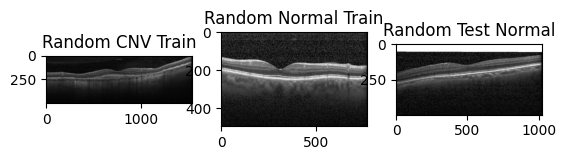

(496, 1536, 3)
(496, 768, 3)
(496, 1024, 3)


In [46]:
# Looking at image size/shape
img = cv2.imread('train/CNV/CNV-81630-20.jpeg')

# Get image shape
img_2 =  cv2.imread('train/NORMAL/NORMAL-1384-5.jpeg')    

img_3 = cv2.imread('test/NORMAL/NORMAL-55652-1.jpeg')

fig, axs = plt.subplots(1, 3)  
axs[0].imshow(img)
axs[0].set_title('Random CNV Train')

axs[1].imshow(img_2)
axs[1].set_title('Random Normal Train')

axs[2].imshow(img_3)
axs[2].set_title('Random Test Normal')

plt.show()
print(img.shape)
print(img_2.shape)
print(img_3.shape)
# as we can see, there's wide variation in shape and errors in imaging (whether in image capture or scanning)

In [276]:
# What color channels are we working with? We need to use Image from PIL because C2V converts to its own color scale, "BGR"

color_img = Image.open('train/CNV/CNV-81630-20.jpeg')
img_gray = color_img.convert('L')

print(color_img.mode)
print(img_gray.mode)

# We're in grayscale! But we still need to convert because this datatype is having issues below - we want this grayscale as 'uint8' 

L
L


In [253]:
# Let's look at the distributions of our grayscale across the datasets:



# The directory where your images are stored
train_cnv_dir = '/Users/admin/Documents/Flatiron/Ocular_Disease_Prediction/train/CNV'
train_normal_dir = '/Users/admin/Documents/Flatiron/Ocular_Disease_Prediction/train/NORMAL'
test_cnv_dir = '/Users/admin/Documents/Flatiron/Ocular_Disease_Prediction/test/CNV'
test_normal_dir = '/Users/admin/Documents/Flatiron/Ocular_Disease_Prediction/test/NORMAL'

# Going to sample because we don't want to crash the kernal
num_samples = 100

# Get a list of all files in each directory
train_cnv_images = [image_name for image_name in os.listdir(train_cnv_dir)]
train_normal_images = [image_name for image_name in os.listdir(train_normal_dir)]
test_cnv_images = [image_name for image_name in os.listdir(test_cnv_dir)]
test_normal_images = [image_name for image_name in os.listdir(test_normal_dir)]

# Sample each list
sampled_train_cnv = random.sample(train_cnv_images, num_samples)
sampled_train_normal = random.sample(train_normal_images, num_samples)
sampled_test_cnv = random.sample(test_cnv_images, num_samples)
sampled_test_normal = random.sample(test_normal_images, num_samples)


directories = ['/Users/admin/Documents/Flatiron/Ocular_Disease_Prediction/train/CNV',
               '/Users/admin/Documents/Flatiron/Ocular_Disease_Prediction/train/NORMAL',
               '/Users/admin/Documents/Flatiron/Ocular_Disease_Prediction/test/CNV',
               '/Users/admin/Documents/Flatiron/Ocular_Disease_Prediction/test/NORMAL'
]

In [263]:
# Let's check out grayscale texture anaylsis!
from skimage import io, feature, color
from skimage.feature import graycomatrix, graycoprops
import pydicom
def calculate_texture_metrics(directories):
   
    contrasts = []
    dissimilarities = []
    homogeneities = []
    energies = []
    correlations = []

   
    for directory in directories:
        # Initialize lists to store texture metrics for this directory
        directory_contrasts = []
        directory_dissimilarities = []
        directory_homogeneities = []
        directory_energies = []
        directory_correlations = []

        # Process each image
        for image_path in directory:
            try: 
            # Load the image
                image = io.imread(image_path)

            # Rescale to work with this module
                image_8bit = np.array(image * 255, dtype=np.uint8)

            # Compute the GLCM.
                glcm = graycomatrix(image_8bit, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)

            # Compute GLCM properties
                contrast = graycoprops(glcm, 'contrast')[0, 0]
                dissimilarity = graycoprops(glcm, 'dissimilarity')[0, 0]
                homogeneity = graycoprops(glcm, 'homogeneity')[0, 0]
                energy = graycoprops(glcm, 'energy')[0, 0]
                correlation = graycoprops(glcm, 'correlation')[0, 0]

            # Append the texture metrics to the directory-specific lists
                directory_contrasts.append(contrast)
                directory_dissimilarities.append(dissimilarity)
                directory_homogeneities.append(homogeneity)
                directory_energies.append(energy)
                directory_correlations.append(correlation)
                
            except FileNotFoundError as e:
                print(f"Error loading image: {image_path}")
                print(e)

        # Append the directory-specific lists to the global lists
            contrasts.append(directory_contrasts)
            dissimilarities.append(directory_dissimilarities)
            homogeneities.append(directory_homogeneities)
            energies.append(directory_energies)
            correlations.append(directory_correlations)

    # Create a stacked bar chart to visualize the texture metrics
    metrics = ['Contrast', 'Dissimilarity', 'Homogeneity', 'Energy', 'Correlation']
    values = [contrasts, dissimilarities, homogeneities, energies, correlations]

    
    fig, ax = plt.subplots()
    for i, metric in enumerate(metrics):
        ax.bar(range(len(directories)), [np.mean(val) for val in values[i]], label=metric)

    ax.set_xlabel('Image Directories')
    ax.set_ylabel('Average Value')
    ax.set_title('Texture Metrics Analysis')
    ax.legend()
    plt.xticks(range(len(image_dirs)), [str(i) for i in range(len(image_dirs))], rotation=45)
    plt.tight_layout()
    plt.show()


In [273]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import feature, color
import pydicom

def calculate_texture_metrics(image_dirs):
    # Initialize lists to store texture metrics
    contrasts = []
    dissimilarities = []
    homogeneities = []
    energies = []
    correlations = []

    # Process each image directory
    for directory in image_dirs:
        # Initialize lists to store texture metrics for this directory
        directory_contrasts = []
        directory_dissimilarities = []
        directory_homogeneities = []
        directory_energies = []
        directory_correlations = []

        # Process each image file in the directory
        for file in os.listdir(directory):
            file_path = os.path.join(directory, file)
            if os.path.isfile(file_path):
                try:
                    # Read DICOM file
                    image = plt.imread(file_path).copy()

                    # Compute texture features
                    glcm = feature.graycomatrix(image, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
                    contrast = feature.graycoprops(glcm, 'contrast')[0, 0]
                    dissimilarity = feature.graycoprops(glcm, 'dissimilarity')[0, 0]
                    homogeneity = feature.graycoprops(glcm, 'homogeneity')[0, 0]
                    energy = feature.graycoprops(glcm, 'energy')[0, 0]
                    correlation = feature.graycoprops(glcm, 'correlation')[0, 0]

                    # Append the texture metrics to the directory-specific lists
                    directory_contrasts.append(contrast)
                    directory_dissimilarities.append(dissimilarity)
                    directory_homogeneities.append(homogeneity)
                    directory_energies.append(energy)
                    directory_correlations.append(correlation)

                except Exception as e:
                    print(f"Error processing image: {file_path}")
                    print(e)

        # Append the directory-specific lists to the global lists
        contrasts.append(directory_contrasts)
        dissimilarities.append(directory_dissimilarities)
        homogeneities.append(directory_homogeneities)
        energies.append(directory_energies)
        correlations.append(directory_correlations)

    # Create a stacked bar chart to visualize the texture metrics
    metrics = ['Contrast', 'Dissimilarity', 'Homogeneity', 'Energy', 'Correlation']
    values = [contrasts, dissimilarities, homogeneities, energies, correlations]

    fig, ax = plt.subplots()
    for i, metric in enumerate(metrics):
        ax.bar(range(len(image_dirs)), [np.mean(val) for val in values[i]], label=metric)

    ax.set_xlabel('Image Directories')
    ax.set_ylabel('Average Value')
    ax.set_title('Texture Metrics Analysis')
    ax.legend()
    plt.xticks(range(len(image_dirs)), [str(i) for i in range(len(image_dirs))], rotation=45)
    plt.tight_layout()
    plt.show()


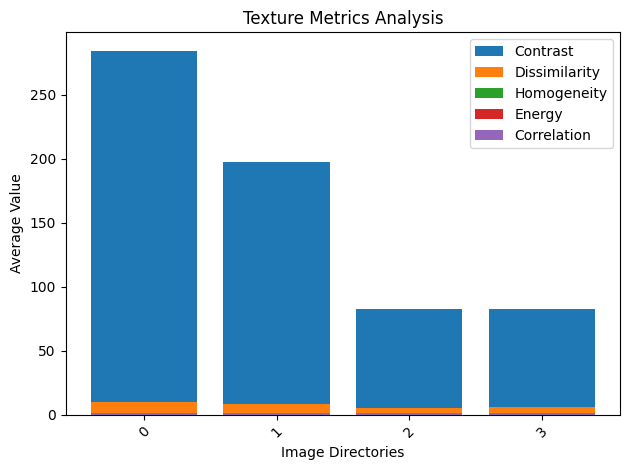

In [274]:
calculate_texture_metrics(directories)

In [275]:
# Our directories are all prelly well-balanced!

### Contrast:
Contrast measures the local intensity variations in an image. It quantifies the difference between the average intensity of a pixel and its neighboring pixels. A higher contrast value indicates a greater difference in intensity values between neighboring pixels, resulting in more distinct boundaries or texture patterns.

### Dissimilarity: 
Dissimilarity measures the difference or diversity in pixel intensities between neighboring pixels. It indicates the average amount of change in intensity between a pixel and its neighbors. A higher dissimilarity value suggests greater variation in pixel intensities, indicating more complex or diverse textures.

### Homogeneity: 
Homogeneity quantifies the similarity or uniformity of pixel intensities within an image or a specific region. It measures the closeness of pixel values to the diagonal elements in the gray level co-occurrence matrix (GLCM). A higher homogeneity value indicates that neighboring pixels have similar intensity values, implying a more homogeneous or uniform texture.

### Energy: 
Energy, also known as Angular Second Moment (ASM), measures the overall uniformity or smoothness of an image texture. It is calculated as the sum of squared GLCM elements. A higher energy value suggests a more uniform distribution of pixel intensities, indicating a smoother or less complex texture.

### Correlation: 
Correlation measures the linear dependency between pixel intensities in an image or a specific region. It quantifies the similarity in pixel intensity patterns across the image. A higher correlation value indicates a stronger linear relationship between pixel intensities, suggesting a more predictable or repetitive texture pattern.




In [206]:
def grayscale_distributions(directories, labels, colors):
    plt.figure(figsize=(10, 6))
    for i, directory in enumerate(directories):
        all_pixels = []
        for image in directory:
            # Only process .jpg or .jpeg files
            if image.endswith('.jpeg') or image.endswith('.jpg'):
                img = image.encode('utf-8')
                img_2 = np.frombuffer(img, dtype=np.uint8)
                img_array = np.array(img_2).flatten()
                
                # Add the pixel values from this image to the list
                all_pixels.extend(img_array)
        
        # Convert the list of all pixel values to a numpy array
        all_pixels_array = np.array(all_pixels)

        # Compute and print some summary statistics
        print('For ' + labels[i] + ':')
        print('Mean:', np.mean(all_pixels_array))
        print('Standard deviation:', np.std(all_pixels_array))
        print('Minimum:', np.min(all_pixels_array))
        print('Maximum:', np.max(all_pixels_array))

        plt.hist(all_pixels_array, bins=256, color=colors[i], alpha=0.8, label=labels[i])
    
    plt.title('Grayscale Histogram')
    plt.xlabel('Grayscale Value')
    plt.ylabel('Pixels')
    plt.legend()

    plt.show()




For Train CNV:
Mean: 66.23819517313746
Standard deviation: 22.8076479159565
Minimum: 45
Maximum: 112
For Train Normal:
Mean: 67.9644527595884
Standard deviation: 21.568015183526793
Minimum: 45
Maximum: 112
For Test CNV:
Mean: 67.23449830890642
Standard deviation: 23.33159390941214
Minimum: 45
Maximum: 112
For Test Normal:
Mean: 68.38420799229658
Standard deviation: 21.73767313508849
Minimum: 45
Maximum: 112


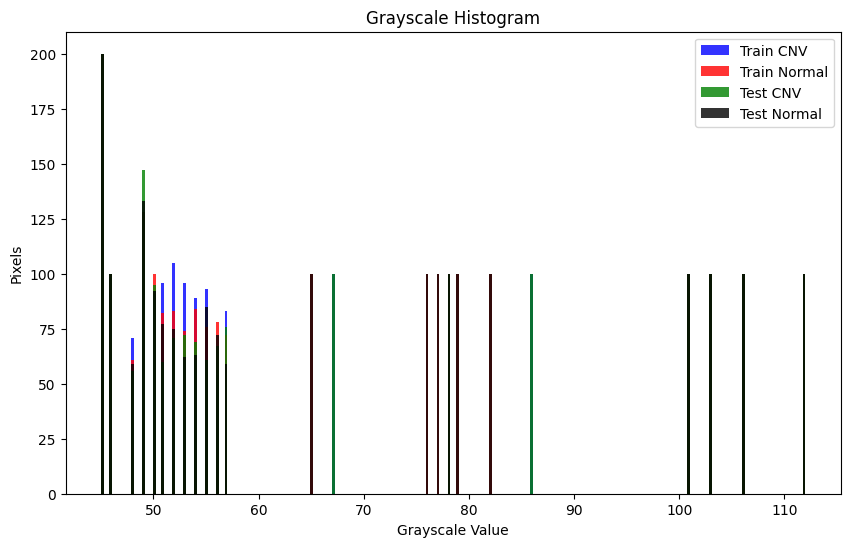

In [172]:
directories = [sampled_train_cnv, sampled_train_normal, sampled_test_cnv, sampled_test_normal]  
labels = ['Train CNV', 'Train Normal', 'Test CNV', 'Test Normal']
colors = ['blue', 'red', 'green', 'black']
grayscale_distributions(directories, labels, colors)


In [277]:

# Let's try this again, but using a scatter plot. Trying to make the information more apparent.

def grayscale_distributions_scatter(directories, labels, colors):
    plt.figure(figsize=(10, 6))
    histograms = []
    bins = np.linspace(0, 256, 255)  # Bin edges for histogram
    for i, directory in enumerate(directories):
        all_pixels = []
        for image in directory:
            # Only process .jpg or .jpeg files
            if image.endswith('.jpeg') or image.endswith('.jpg'):
                img = image.encode('utf-8')
                img_2 = np.frombuffer(img, dtype=np.uint8)
                img_array = np.array(img_2).flatten()
                
                # Add the pixel values from this image to the list
                all_pixels.extend(img_array)
        
        # Convert the list of all pixel values to a numpy array
        all_pixels_array = np.array(all_pixels)

        # Compute and print some summary statistics
        print('For ' + labels[i] + ':')
        print('Mean:', np.mean(all_pixels_array))
        print('Standard deviation:', np.std(all_pixels_array))
        print('Minimum:', np.min(all_pixels_array))
        print('Maximum:', np.max(all_pixels_array))
        
        
        # Compute histogram for this directory and add it to the list
        histogram, _ = np.histogram(all_pixels_array, bins=bins)
        histograms.append(histogram)

    # Plot scatter
    for i, histogram in enumerate(histograms):
        plt.scatter(bins[:-1], histogram, color=colors[i], alpha=0.5, label=labels[i])
    
    plt.title('Grayscale Scatterplot')
    plt.xlabel('Grayscale Value')
    plt.ylabel('Pixels')
    plt.legend(loc='upper right')

    plt.show()



In [278]:
grayscale_distributions_scatter(directories, labels, colors)



For Train CNV:
Mean: nan
Standard deviation: nan


/Users/admin/anaconda3/envs/tf_env/lib/python3.8/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/admin/anaconda3/envs/tf_env/lib/python3.8/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/Users/admin/anaconda3/envs/tf_env/lib/python3.8/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


ValueError: zero-size array to reduction operation minimum which has no identity

<Figure size 1000x600 with 0 Axes>

For Train CNV:
Mean: 66.43759873617694
Standard deviation: 22.73951396214217
Minimum: 45
Maximum: 112
For Train Normal:
Mean: 68.11183902667291
Standard deviation: 21.469180776110154
Minimum: 45
Maximum: 112
For Test CNV:
Mean: 67.17604049493814
Standard deviation: 23.328700988999167
Minimum: 45
Maximum: 112


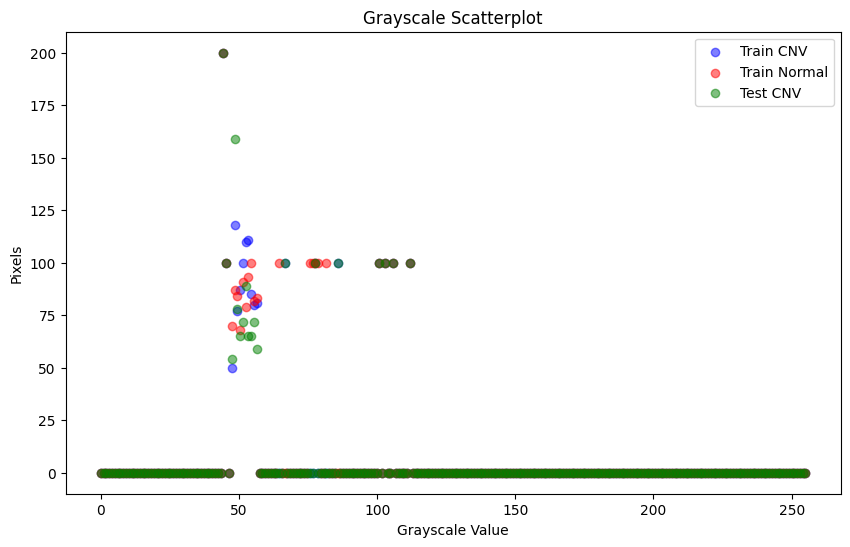

In [279]:
# Running without test normal so we can see other colors:

directories_2 = [sampled_train_cnv, sampled_train_normal, sampled_test_cnv]
grayscale_distributions_scatter(directories_2, labels, colors)


For Train CNV:
Mean: 66.43759873617694
Standard deviation: 22.73951396214217
Minimum: 45
Maximum: 112
For Train Normal:
Mean: 68.11183902667291
Standard deviation: 21.469180776110154
Minimum: 45
Maximum: 112


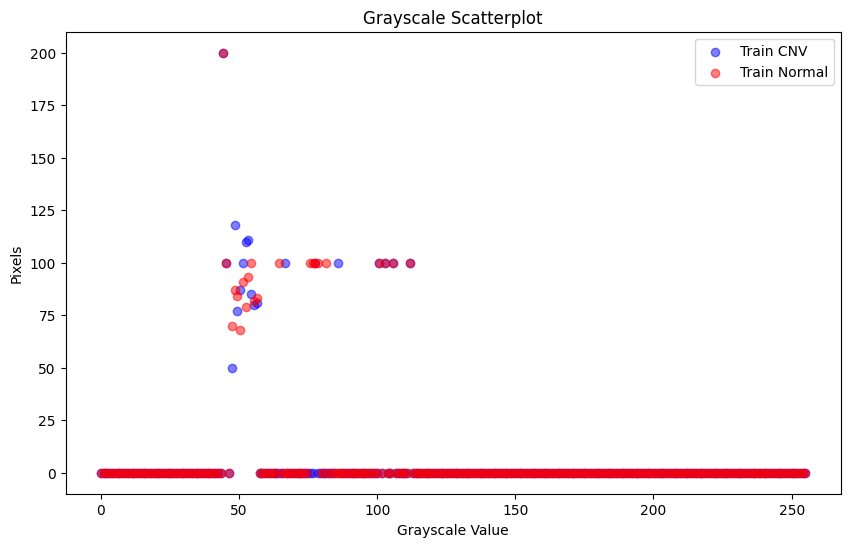

In [280]:

directories_3 = [sampled_train_cnv, sampled_train_normal]
grayscale_distributions_scatter(directories_3, labels, colors)

For Train CNV:
Mean: 66.43759873617694
Standard deviation: 22.73951396214217
Minimum: 45
Maximum: 112


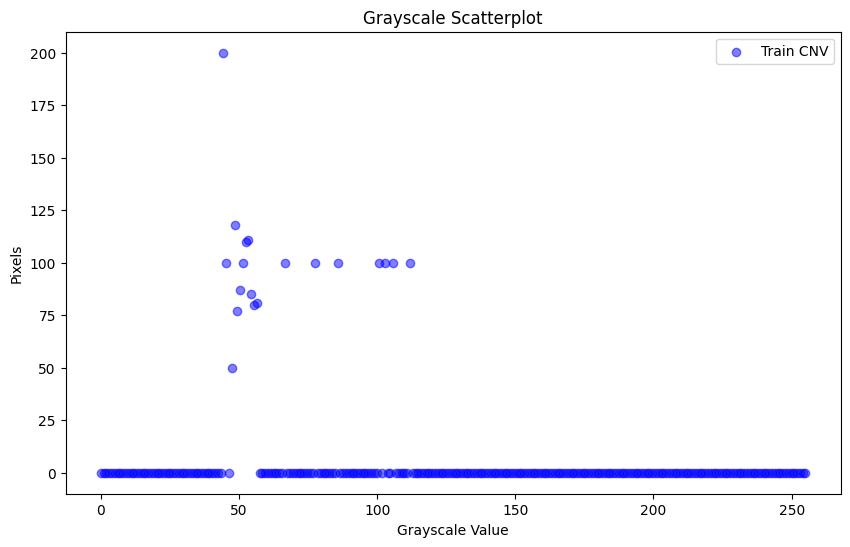

In [281]:

directories_4 = [sampled_train_cnv]
grayscale_distributions_scatter(directories_4, labels, colors)

In [210]:
# import matplotlib.animation as animation

# def animate_scatter(i, scatters, directories, labels, colors):
#     for i, directory in enumerate(directories):
#         all_pixels = []
#         for image in directory:
#             img = image.encode('utf-8')
#             img_2 = np.frombuffer(img, dtype=np.uint8)
#             img_array = np.array(img_2).flatten()
                
#             # Add the pixel values from this image to the list
#             all_pixels.extend(img_array)
        
#     # Convert the list of all pixel values to a numpy array
#             all_pixels_array = np.array(all_pixels)

#     # Compute histogram for this directory
#     histogram, bins = np.histogram(all_pixels_array, bins=np.linspace(0, 256, 257))

#     # Update scatter plot
#     scatters[i].set_offsets(np.c_[bins[:-1], histogram])
#     scatters[i].set_label(labels[i])
    



# def grayscale_distributions_animated(directories, labels, colors):
#     for i, directory in enumerate(directories):
#         all_pixels = []
#         for image in directory:
#             img = image.encode('utf-8')
#             img_2 = np.frombuffer(img, dtype=np.uint8)
#             img_array = np.array(img_2).flatten()
#         # Add the pixel values from this image to the list
#             all_pixels.extend(img_array)
#     fig, ax = plt.subplots()

#     # Initialize scatter plots
#     # Initialize scatter plots
#     scatters = [ax.scatter([], [], color=color, alpha=0.5, label=label) for color, label in zip(colors, labels)]


#     ax.set_xlim(0, 256)
#     ax.set_ylim(0, max([np.max(np.histogram(np.random.rand(1000), bins=256)[0]) for _ in range(4)]))  # Maximum value over all histograms
#     ax.set_xlabel('Grayscale Value')
#     ax.set_ylabel('Pixels')
#     ax.legend()

#     ani = animation.FuncAnimation(fig, animate_scatter, frames=4, fargs=(scatters, directories, labels, colors), interval=1000, repeat=False)
#     plt.show()
#     return ani

In [213]:
# from IPython.display import HTML


# # When you call the function
# ani = grayscale_distributions_animated(directories, labels, colors)

In [214]:
# #
# HTML(ani.to_jshtml())




In [28]:
train_image_path_cnv = '/train/CNV'
train_image_path_normal = '/train/NORMAL'
test_image_path_cnv = '/test/CNV'
test_image_path_normal = '/test/NORMAL'

In [284]:
# create training data
# check rgb channels
train_dir = 'train/'
train_datagen = ImageDataGenerator(rescale=1./255, validation_split=.2, horizontal_flip=True, fill_mode='nearest')

# creating generators
train_generator = train_datagen.flow_from_directory(train_dir, target_size=(224, 224), color_mode="grayscale", shuffle=True,
                                                    batch_size=32, class_mode='categorical', seed=42)


validation_generator = train_datagen.flow_from_directory(
    train_dir, # same directory as training data
    target_size=(224, 224),
    batch_size=32,
    color_mode='grayscale',
    class_mode='categorical',
    shuffle=True,
    seed=42,
    subset='validation')



Found 58222 images belonging to 2 classes.
Found 11644 images belonging to 2 classes.


In [286]:
# Generate test data

test_dir = 'test/'
test_datagen = ImageDataGenerator(rescale=1./255,horizontal_flip=True, fill_mode='nearest')
test_generator = train_datagen.flow_from_directory(test_dir, target_size=(224, 224), color_mode="grayscale", 
                                                    batch_size=32, class_mode='categorical', shuffle=True, seed=42)


Found 500 images belonging to 2 classes.


In [ ]:
# We have very large training and validation sets compared to our test set

In [288]:
image_shape_train = train_generator.image_shape
image_shape_validation = validation_generator.image_shape
image_shape_test = test_generator.image_shape
print(f'The shape of the images is: {image_shape_train, image_shape_validation,image_shape_test}')

The shape of the images is: ((224, 224, 1), (224, 224, 1), (224, 224, 1))


In [293]:
train_labels = train_generator.classes
label, count = np.unique(train_labels, return_counts=True)
label_count = list(zip(label, count))
print(f'Train Label Count: {label_count}')

validation_labels = validation_generator.classes
label, count = np.unique(validation_labels, return_counts=True)
label_count = list(zip(label, count))
print(f'Validation Label Count: {label_count}')

test_labels = test_generator.classes
label, count = np.unique(test_labels, return_counts=True)
label_count = list(zip(label, count))
print(f'Test Label Count: {label_count}')

# Evenly split test data. very small sample size! 

Train Label Count: [(0, 7082), (1, 51140)]
Validation Label Count: [(0, 1416), (1, 10228)]
Test Label Count: [(0, 250), (1, 250)]


In [54]:
# Create a function that displays random images from our datasets along with their class labels



def display_all_images(data, num_batches):
  
    # Get the class names
    class_names = list(data.class_indices.keys())

    for batch_num in range(num_batches):
        # Get a batch of data
        images, labels = next(data)

        # Get the number of images
        num_images = images.shape[0]

        # Calculate the number of rows and columns for the grid
        num_cols = 4
        num_rows = num_images // num_cols if num_images % num_cols == 0 else num_images // num_cols + 1

        # Create a figure
        fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
        axes = axes.ravel()

        # Plot each image
        for i in range(num_images):
            img = images[i]
            label = labels[i]
            class_name = class_names[np.argmax(label)]

            axes[i].imshow(img, cmap='gray')
            axes[i].set_title(class_name)
            axes[i].axis('off')

        # Remove the axes for any unused subplots
        if num_images < num_rows * num_cols:
            for i in range(num_images, num_rows * num_cols):
                fig.delaxes(axes[i])

        # Show the plot
        plt.tight_layout()
        plt.show()



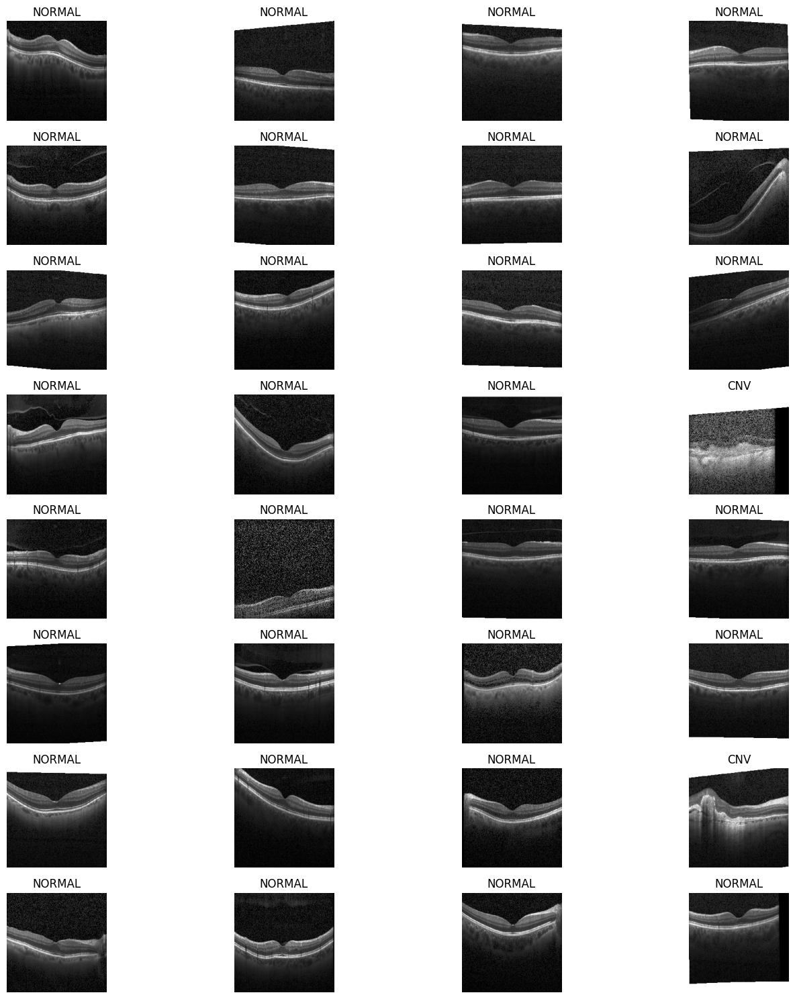

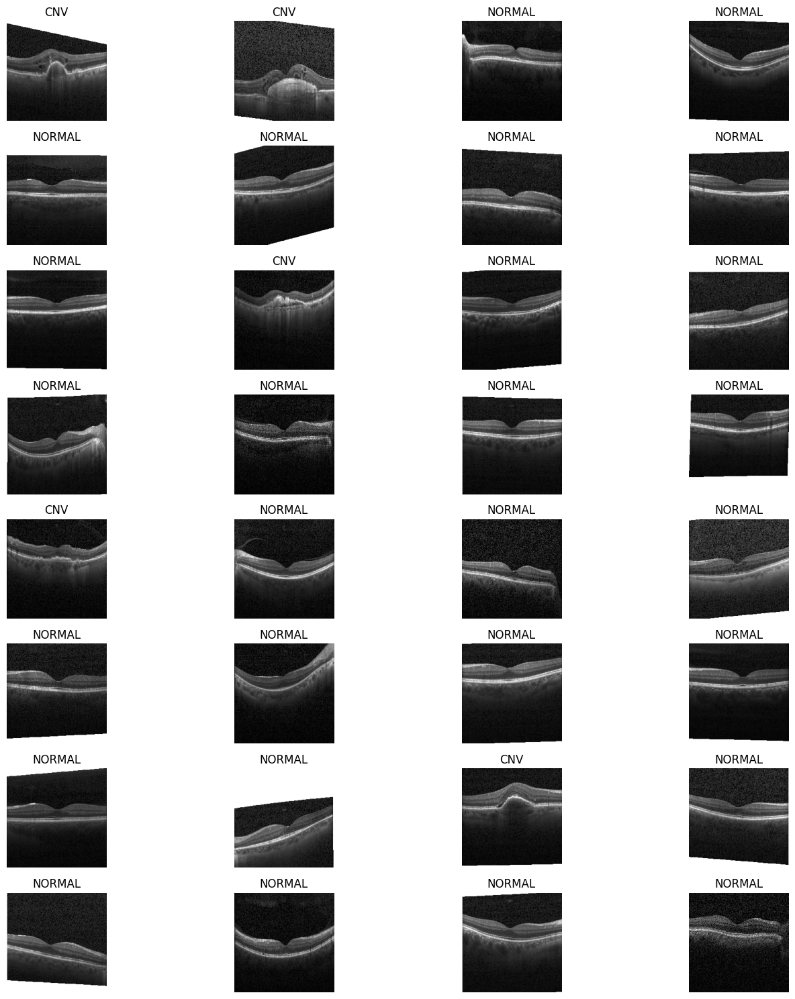

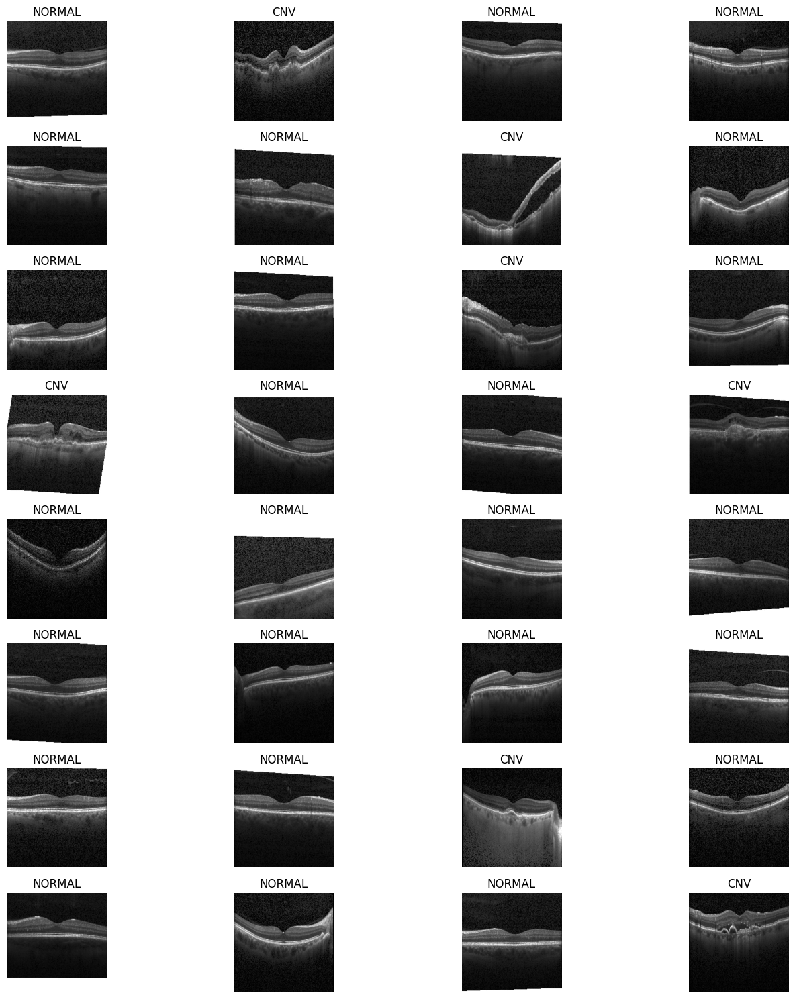

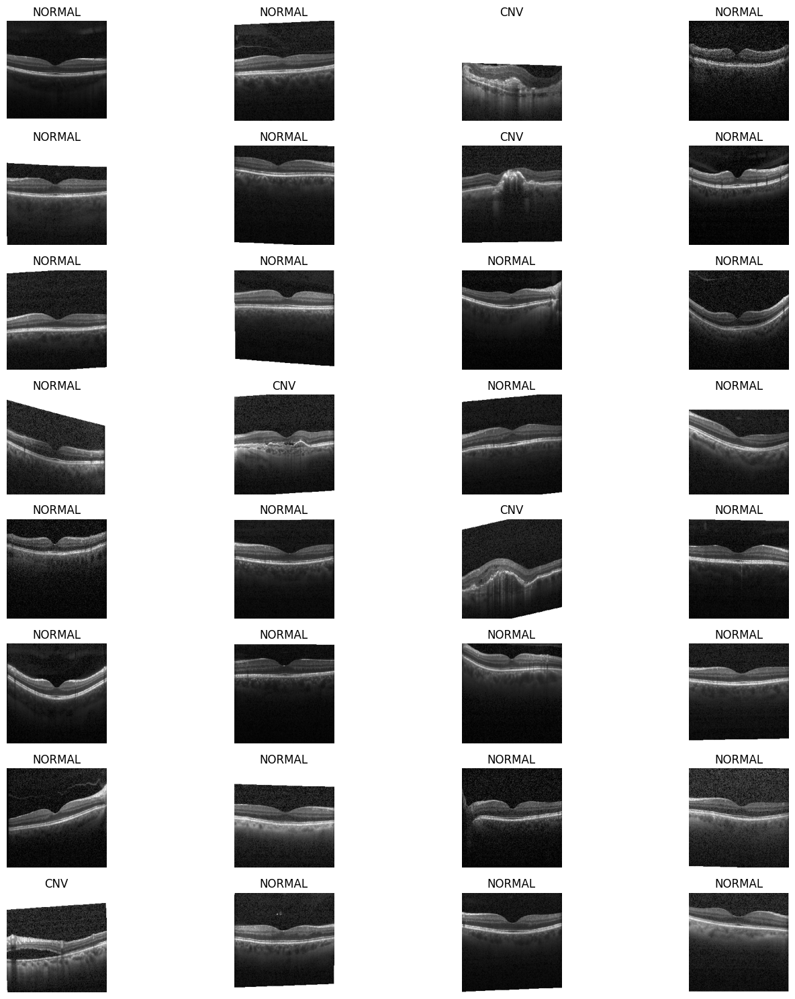

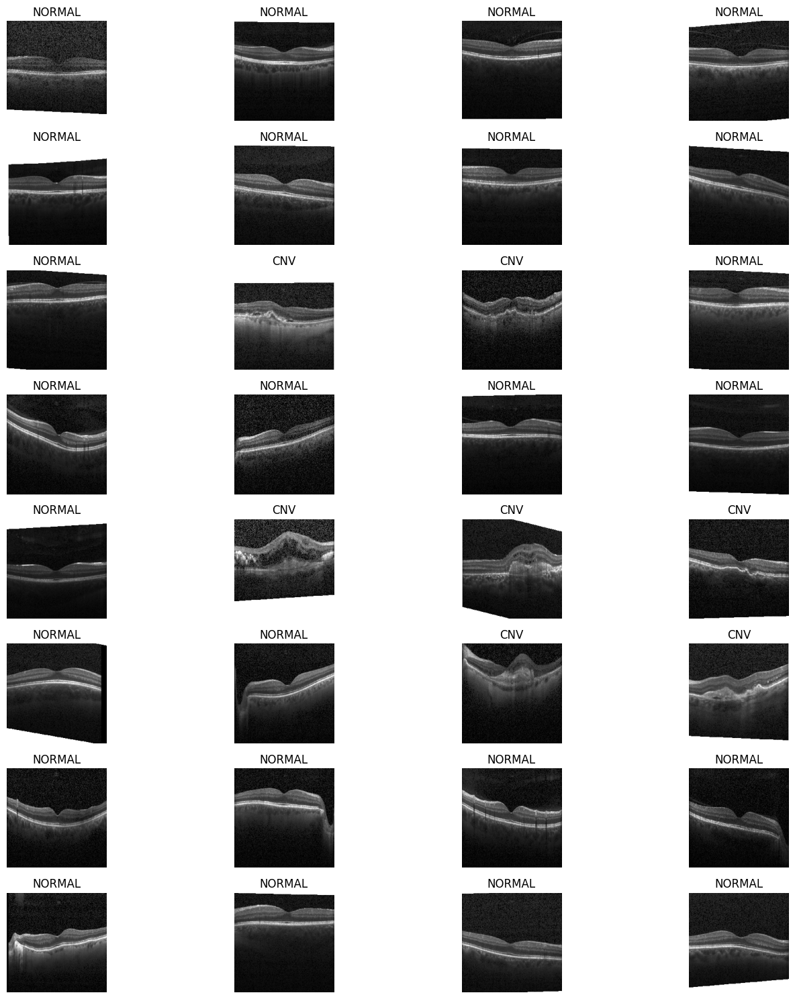

In [55]:

display_all_images(train_generator, 5)





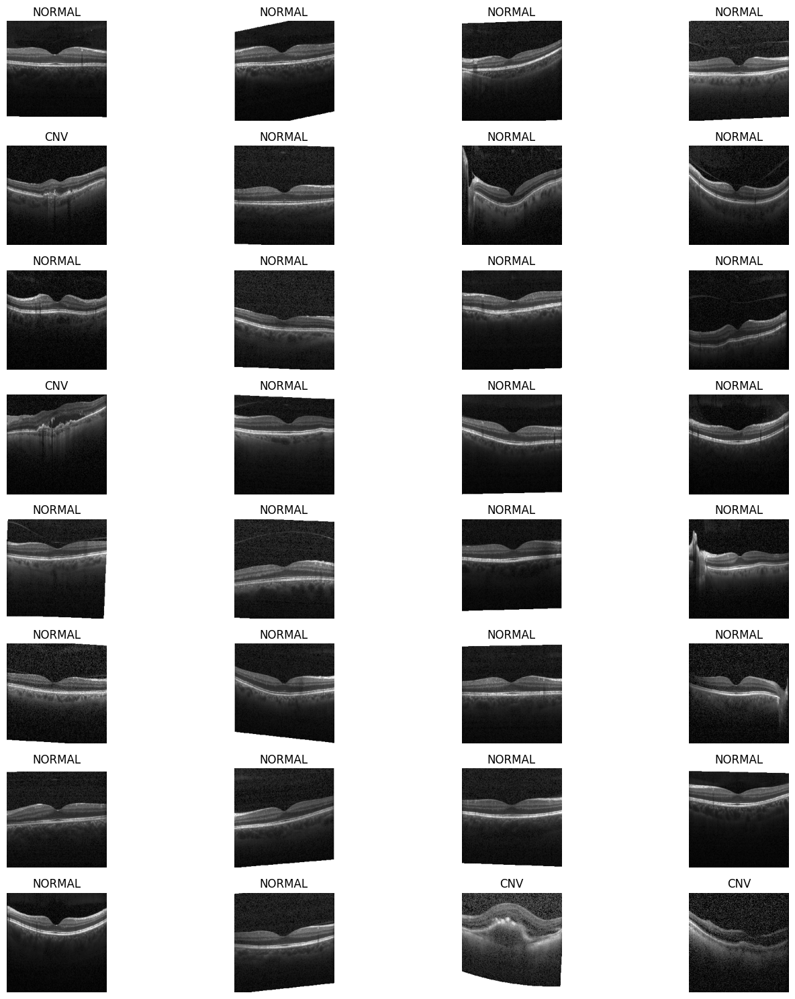

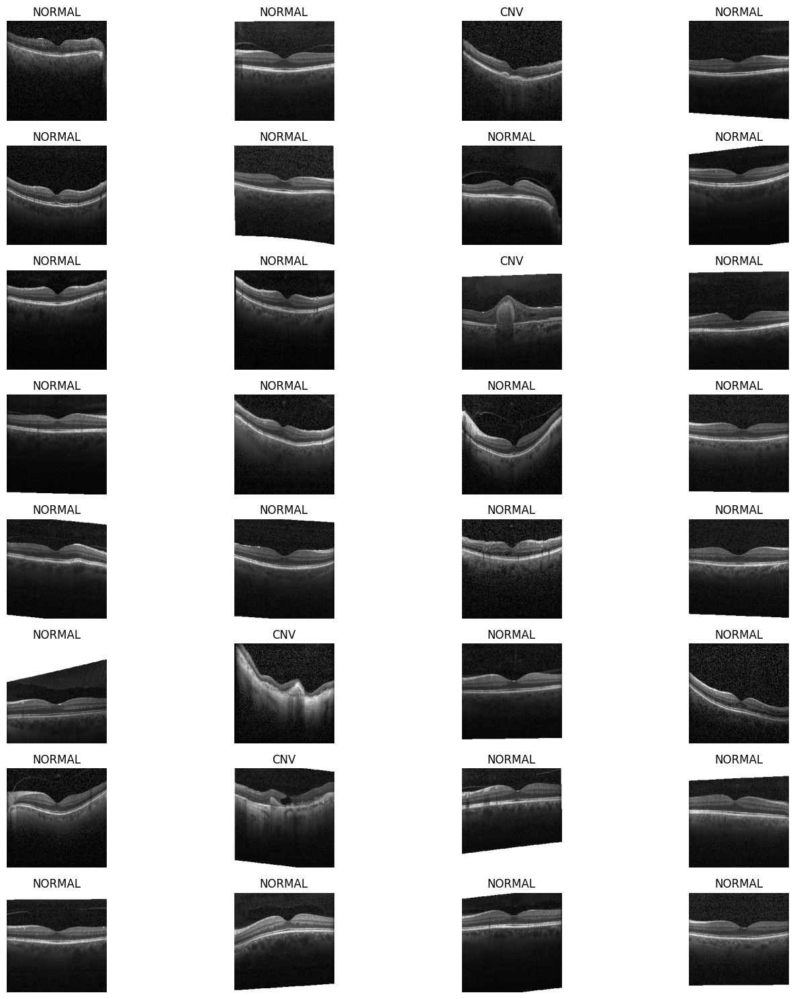

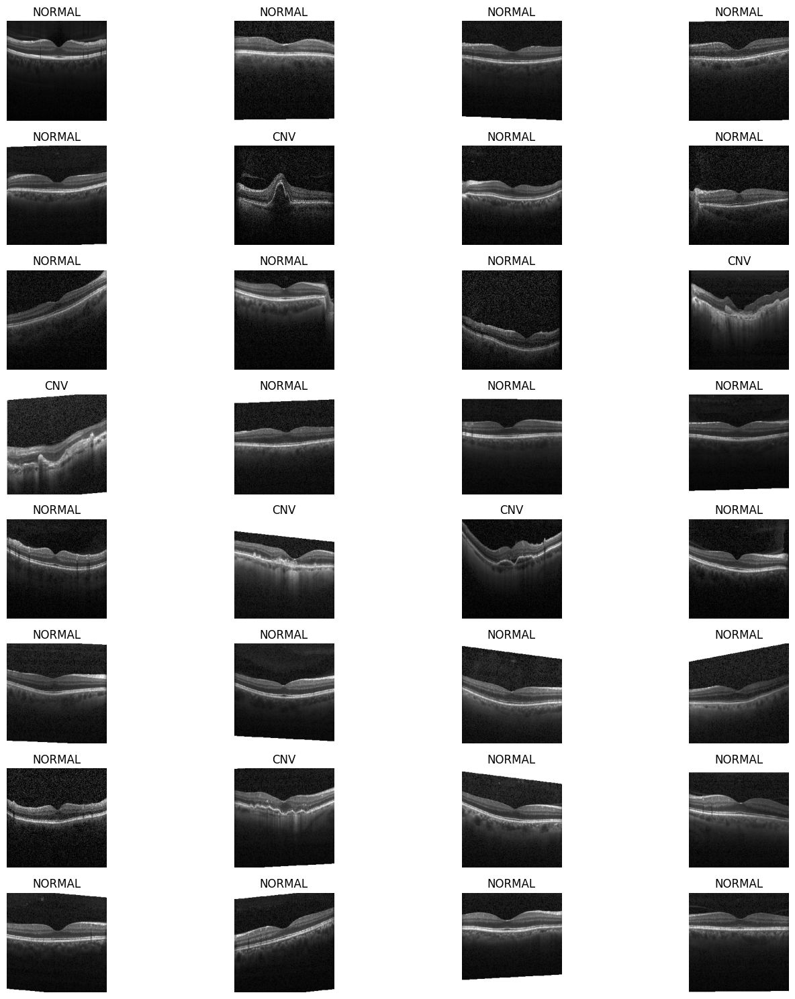

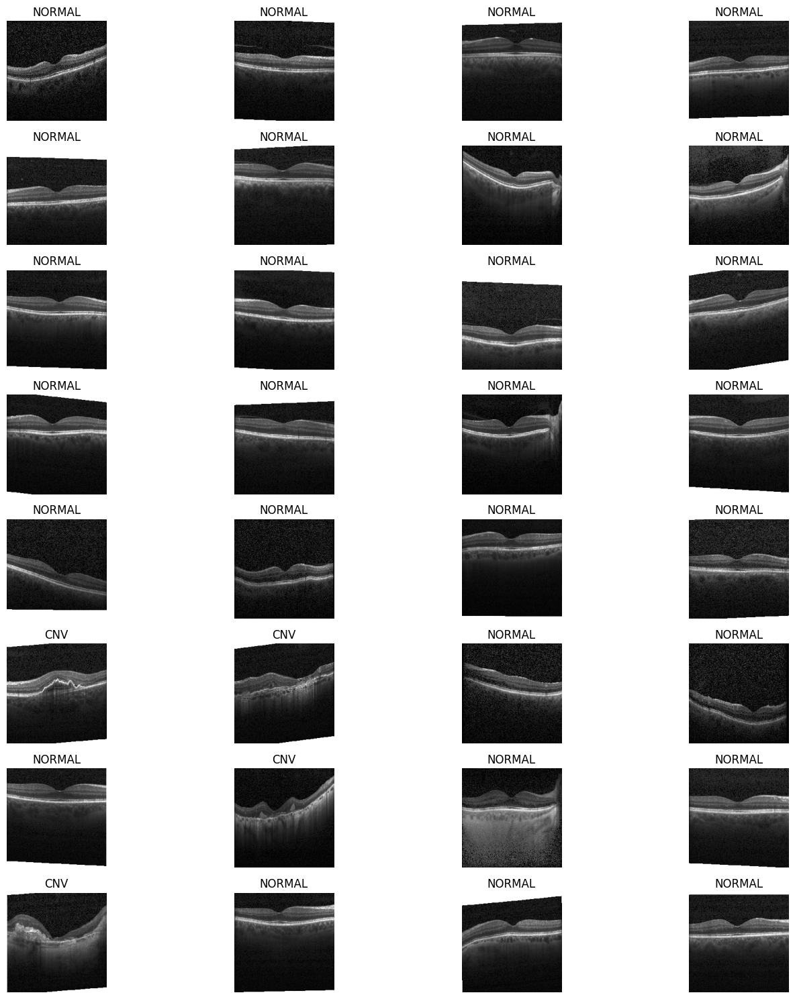

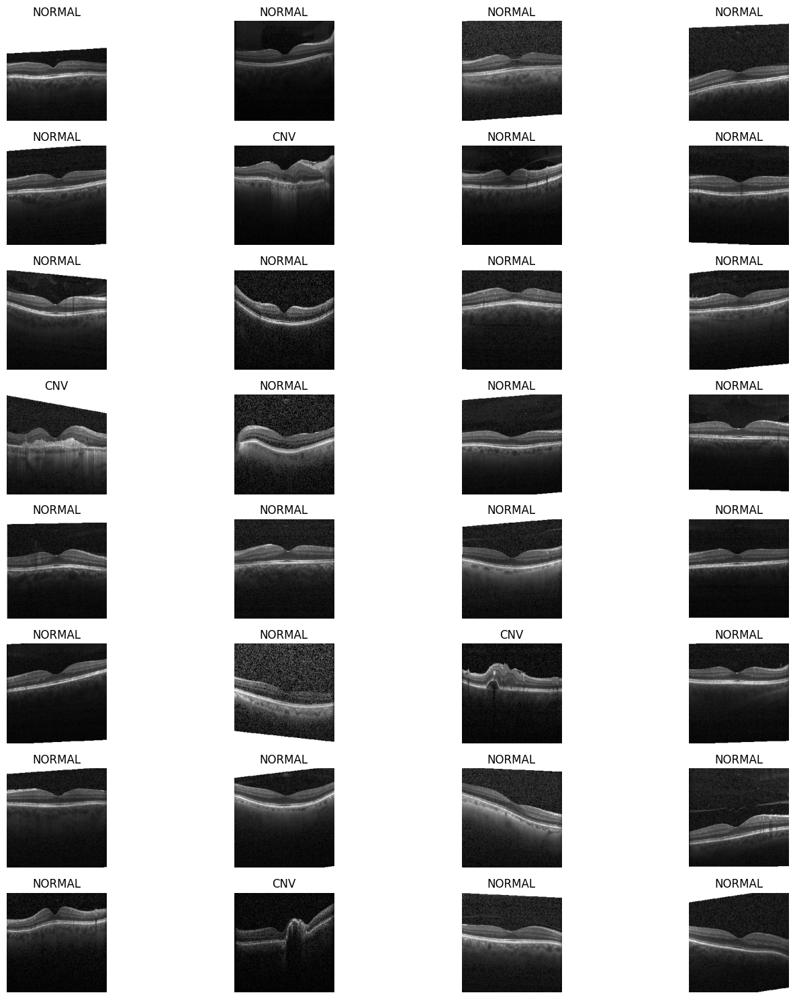

In [56]:
display_all_images(validation_generator, 5)

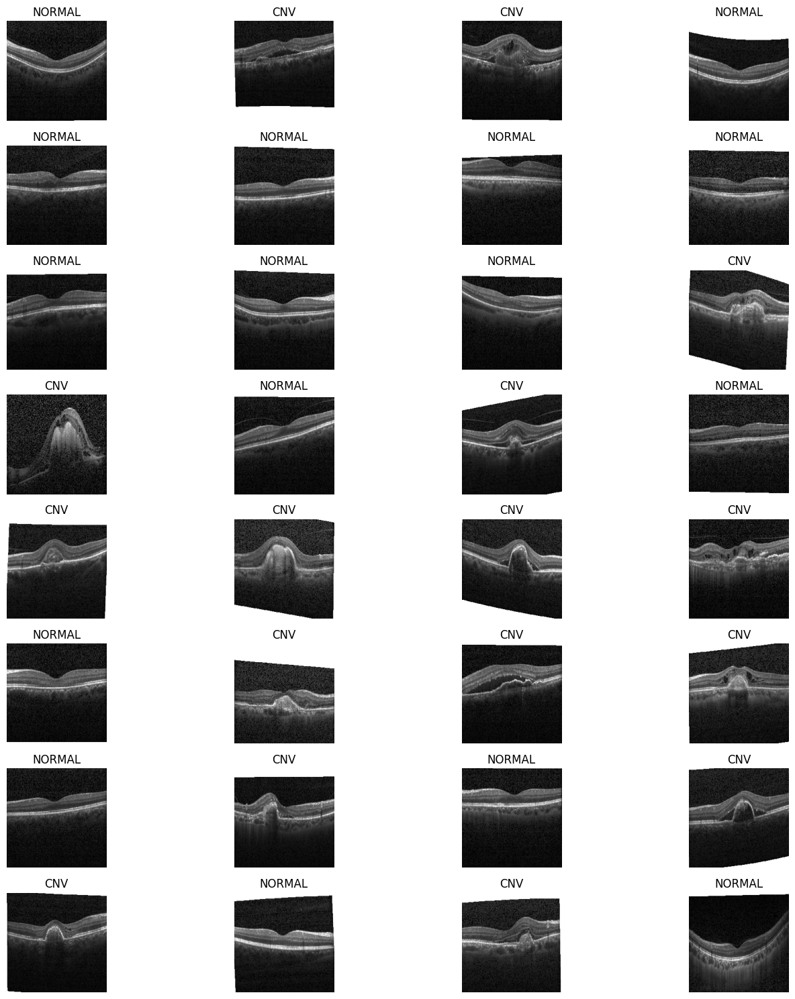

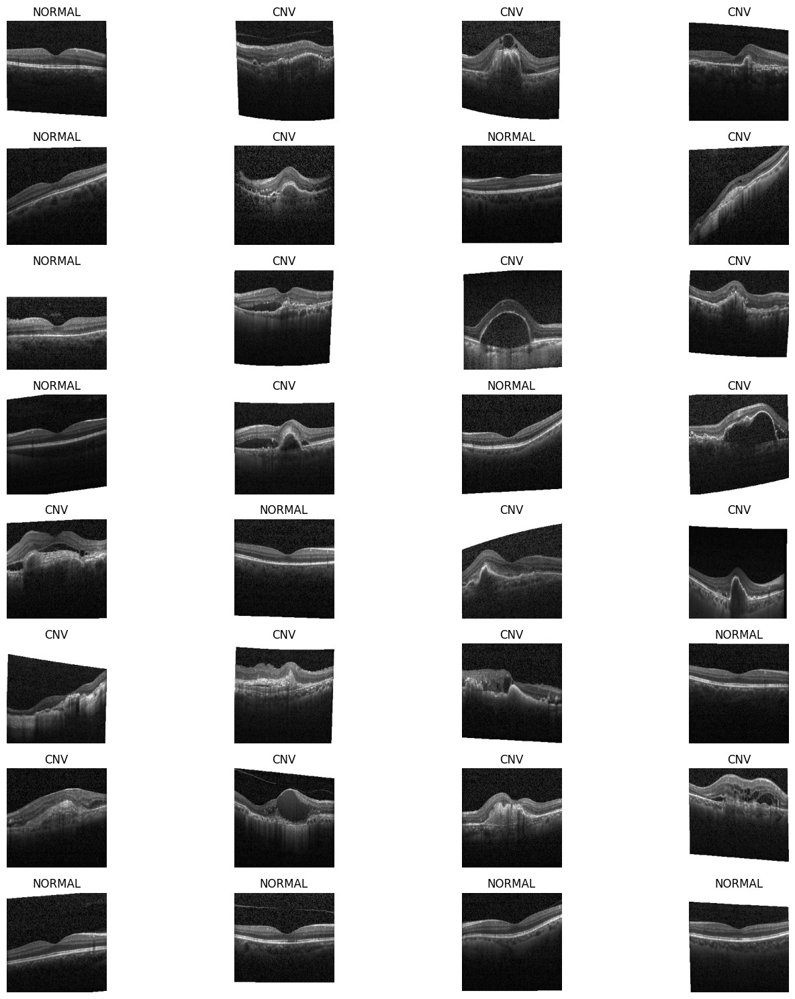

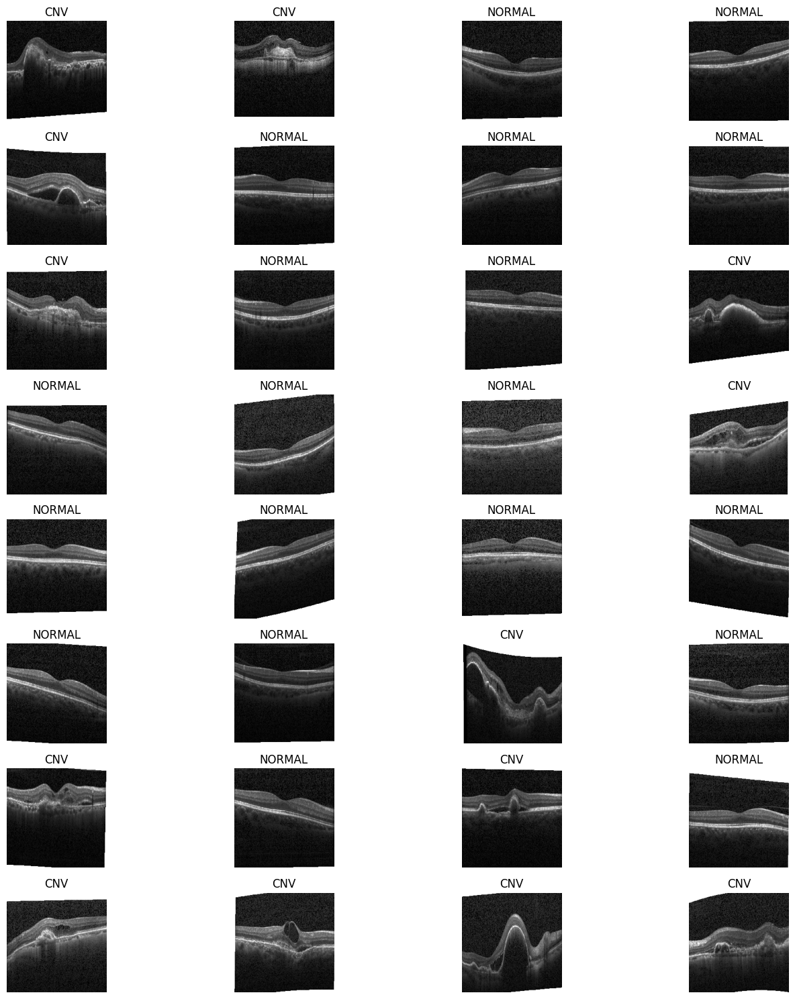

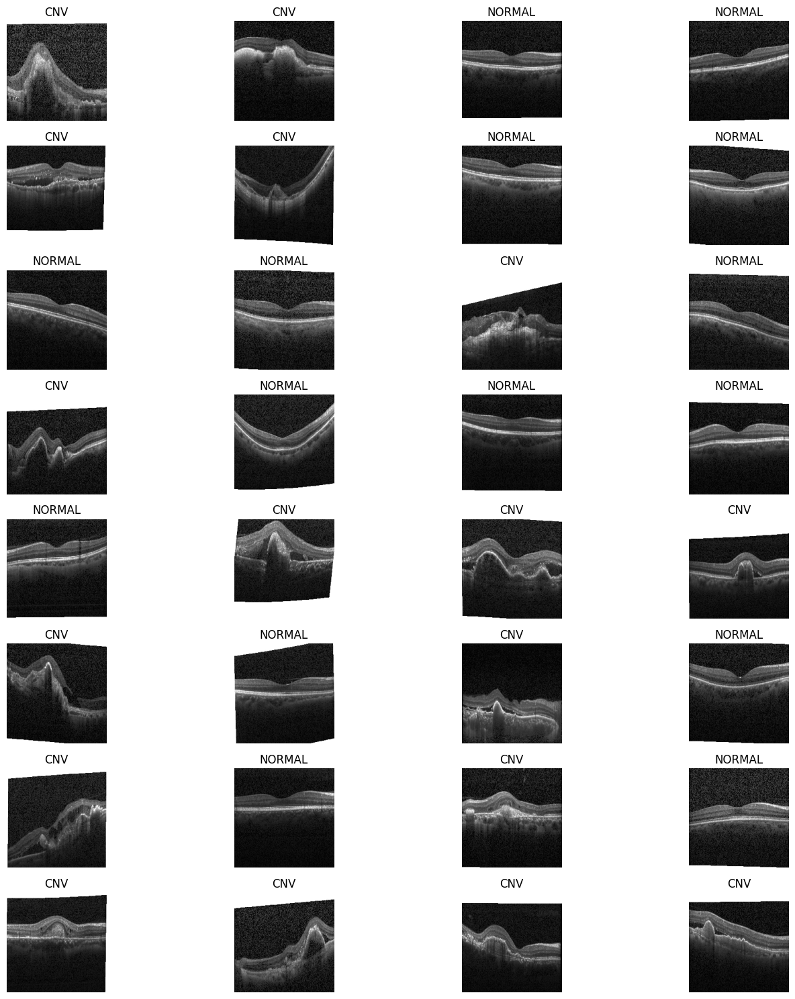

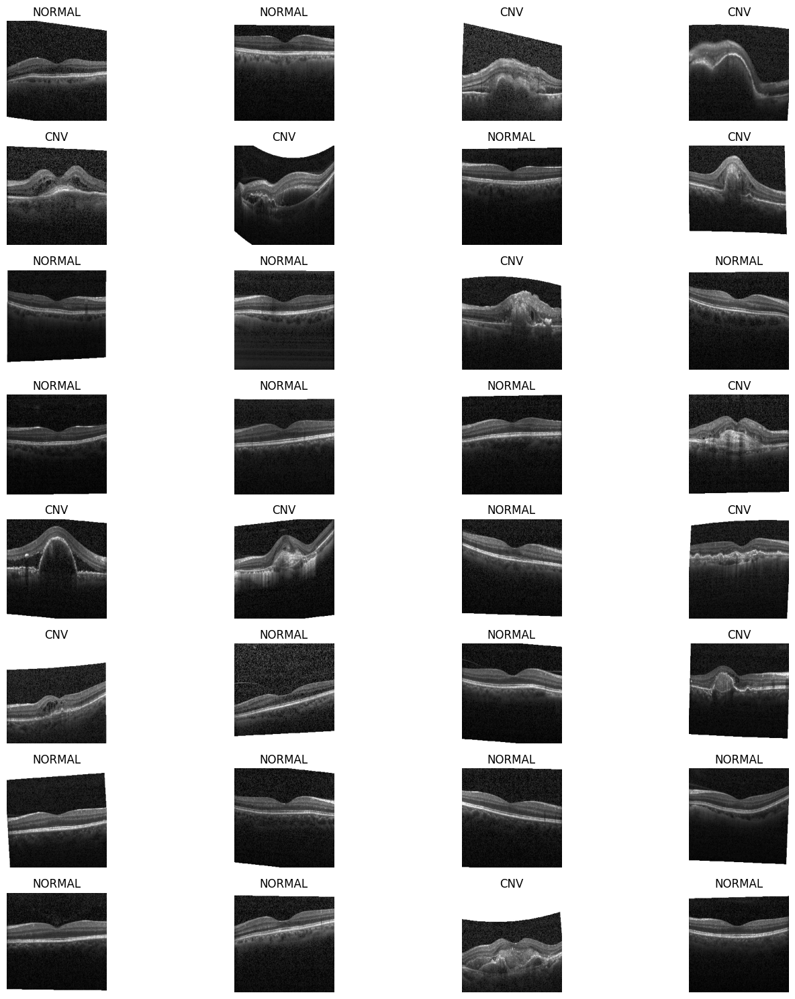

In [19]:

display_all_images(test_generator, 5)

In [57]:
def arrays(data, num_batches):
    
    # Initialize a list to store the image arrays and labels
    image_arrays = []
    labels_arrays = []

    for batch_num in range(num_batches):
        # Get a batch of data
        images, labels = next(data)

        # Randomly select an index
        idx = np.random.choice(images.shape[0])

        # Append the selected image and label to the respective lists
        image_arrays.append(images[idx])
        labels_arrays.append(labels[idx])

    # Return the image arrays and labels
    return image_arrays, labels_arrays



In [21]:
arrays(train_generator, 5)

([array([[[1.        ],
          [1.        ],
          [1.        ],
          ...,
          [0.04705883],
          [0.07843138],
          [0.04313726]],
  
         [[1.        ],
          [1.        ],
          [1.        ],
          ...,
          [0.10196079],
          [0.0627451 ],
          [0.07058824]],
  
         [[1.        ],
          [1.        ],
          [1.        ],
          ...,
          [0.10196079],
          [0.07843138],
          [0.01568628]],
  
         ...,
  
         [[0.05882353],
          [0.05490196],
          [0.        ],
          ...,
          [0.03529412],
          [0.04705883],
          [0.01568628]],
  
         [[0.02352941],
          [0.04313726],
          [0.00784314],
          ...,
          [0.01960784],
          [0.01568628],
          [0.00784314]],
  
         [[0.01960784],
          [0.03921569],
          [0.03137255],
          ...,
          [0.02352941],
          [0.01176471],
          [0.02352941]]], dtype=f

In [24]:
arrays(validation_generator, 5)

([array([[[0.04313726],
          [0.06666667],
          [0.01960784],
          ...,
          [0.        ],
          [0.10588236],
          [0.0509804 ]],
  
         [[0.00784314],
          [0.00784314],
          [0.00784314],
          ...,
          [0.02745098],
          [0.09019608],
          [0.14901961]],
  
         [[0.        ],
          [0.05490196],
          [0.1137255 ],
          ...,
          [0.14901961],
          [0.        ],
          [0.07450981]],
  
         ...,
  
         [[0.00392157],
          [0.00784314],
          [0.00392157],
          ...,
          [0.00784314],
          [0.02352941],
          [0.01960784]],
  
         [[0.        ],
          [0.00784314],
          [0.00784314],
          ...,
          [0.02352941],
          [0.02352941],
          [0.        ]],
  
         [[0.        ],
          [0.00392157],
          [0.00392157],
          ...,
          [0.01568628],
          [0.01176471],
          [0.00784314]]], dtype=f

In [22]:
arrays(test_generator, 5)

([array([[[0.02352941],
          [0.12156864],
          [0.16470589],
          ...,
          [0.1254902 ],
          [0.21176472],
          [0.08627451]],
  
         [[0.01176471],
          [0.14901961],
          [0.16470589],
          ...,
          [0.11764707],
          [0.06666667],
          [0.10588236]],
  
         [[0.04705883],
          [0.09803922],
          [0.07058824],
          ...,
          [0.07450981],
          [0.        ],
          [0.08235294]],
  
         ...,
  
         [[1.        ],
          [1.        ],
          [1.        ],
          ...,
          [0.04313726],
          [0.06666667],
          [0.04705883]],
  
         [[1.        ],
          [1.        ],
          [1.        ],
          ...,
          [0.01176471],
          [0.03529412],
          [0.03137255]],
  
         [[1.        ],
          [1.        ],
          [1.        ],
          ...,
          [1.        ],
          [1.        ],
          [1.        ]]], dtype=f

## Modelling 

In [12]:
model = Sequential()
# define 3x3 filter window sizes. Create 32 filters.
model.add(Conv2D(filters=32,
                        kernel_size=(3, 3),
                        activation='relu',
                        input_shape=(224, 224, 1)))


# max pool in 2x2 window
model.add(MaxPooling2D(pool_size=(2, 2)))
# define 3x3 filter window sizes. Create 64 filters.
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))

# connect nodes all nodes with dense layers 
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dense(2, activation='sigmoid'))


bce = tf.keras.losses.BinaryCrossentropy()


model.compile(optimizer='adam', loss=bce,  metrics=['accuracy'])


In [13]:
base_model = model.fit(
        train_generator,
        steps_per_epoch=100,verbose =1,validation_data = validation_generator, 
        epochs=2)

Epoch 1/2
100/100 [==============================] - 190s 2s/step - loss: 0.3660 - accuracy: 0.8687 - val_loss: 0.2657 - val_accuracy: 0.8784
Epoch 2/2
100/100 [==============================] - 188s 2s/step - loss: 0.2365 - accuracy: 0.8903 - val_loss: 0.1990 - val_accuracy: 0.8877


In [14]:
# y_pred = model.predict(train_generator)
# y_pred_classes = np.argmax(y_pred, axis=1)
# y_true_classes = np.argmax(train_generator, axis=1)

# cm = confusion_matrix(y_true_classes, y_pred_classes)
# print(cm)

# fpr, tpr, thresholds = roc_curve(train_generator, y_pred)
# roc_auc = auc(fpr, tpr)


# plt.plot(fpr, tpr)
         
         

1820/1820 [==============================] - 459s 252ms/step


NameError: name 'ct_train_generator' is not defined